<a href="https://colab.research.google.com/github/rhmau1/PCVK_26/blob/main/Modul3/Modul3_D1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


transformasi linier brigthness

mngubah tingkat kecerahan citra
----------
masukkan nilai kecerahan: 30


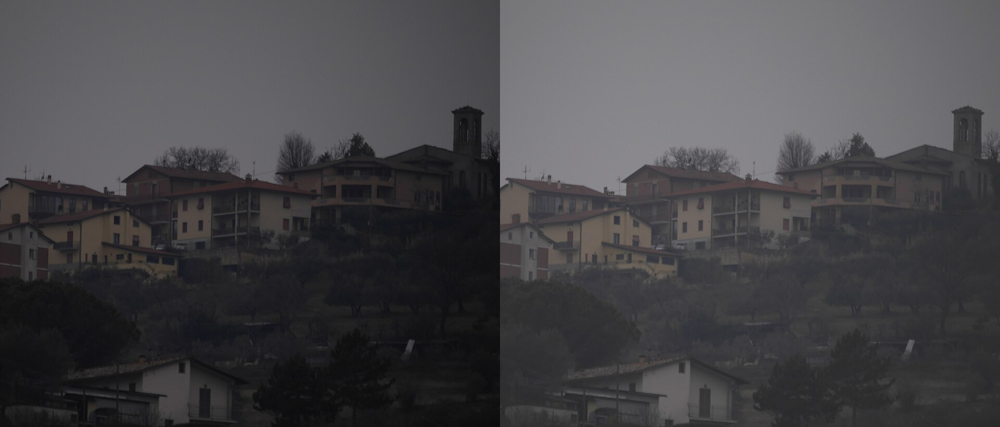

In [4]:
import numpy as np
import cv2 as cv
from google.colab.patches import cv2_imshow

print("mngubah tingkat kecerahan citra")
print("----------")
try:
  brightness = int(input("masukkan nilai kecerahan: "))
except ValueError:
  print("error , not a number")

# sesuaikan dgn file dan folder di drive
original = cv.imread("/content/drive/MyDrive/TI 3C RESOURCES /PCVK/Images/houses.jpg")
brightness_image = np.zeros(original.shape, original.dtype)

# akses per piksel
# np.clip digunakan u melakukan truncate pixel dibatasi antara 0 - 255
for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    for c in range(original.shape[2]):
      brightness_image[y,x,c] = np.clip(original[y,x,c] + brightness, 0, 255)
# cara simple tanpa for loop
# brightness_image = cv.convertScaleAbs(original, beta = brightness)

final_frame = cv.hconcat((original, brightness_image))
cv2_imshow(final_frame)

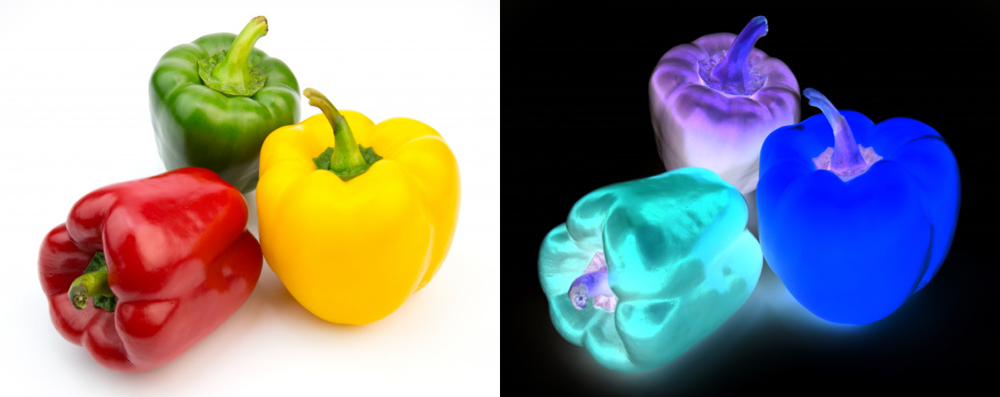

In [5]:
before_inverse = cv.imread("/content/drive/MyDrive/TI 3C RESOURCES /PCVK/Images/peppers.jpg")

# rumus inverse
# g(x) = 255 - f(x)
# g(x) gambar inverse dan f(x) gambar original
after_inverse = 255 - before_inverse
final_frame = cv.hconcat((before_inverse, after_inverse))
cv2_imshow(final_frame)

mngubah kontras dan tingkat kecerahan citra
----------
masukkan nilai kecerahan: 10
masukkan kontras: 1.5


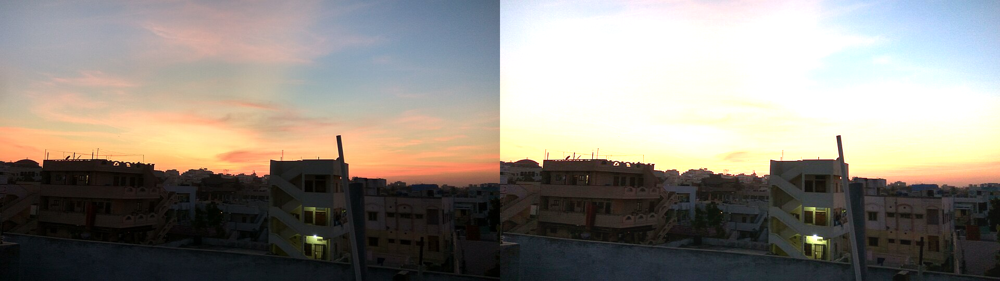

In [6]:
# transformasi kontras masukkan kecerahan dan kontras
import numpy as np
import cv2 as cv
from google.colab.patches import cv2_imshow

print("mngubah kontras dan tingkat kecerahan citra")
print("----------")
try:
  brightness = int(input("masukkan nilai kecerahan: "))
except ValueError:
  print("error , not a number")

try:
  contrast = np.double(input("masukkan kontras: "))
except ValueError:
  print("error , not a number")

# sesuaikan dgn file dan folder di drive
original = cv.imread("/content/drive/MyDrive/TI 3C RESOURCES /PCVK/Images/sunset.jpg")

# g(x,y) = a*f(x,y)+b
result = cv.convertScaleAbs(original, alpha=contrast, beta=brightness)

final_frame = cv.hconcat((original, result))
cv2_imshow(final_frame)

mngubah tingkat kecerahan citra dgn transformasi log
----------
masukkan nilai kecerahan: 10


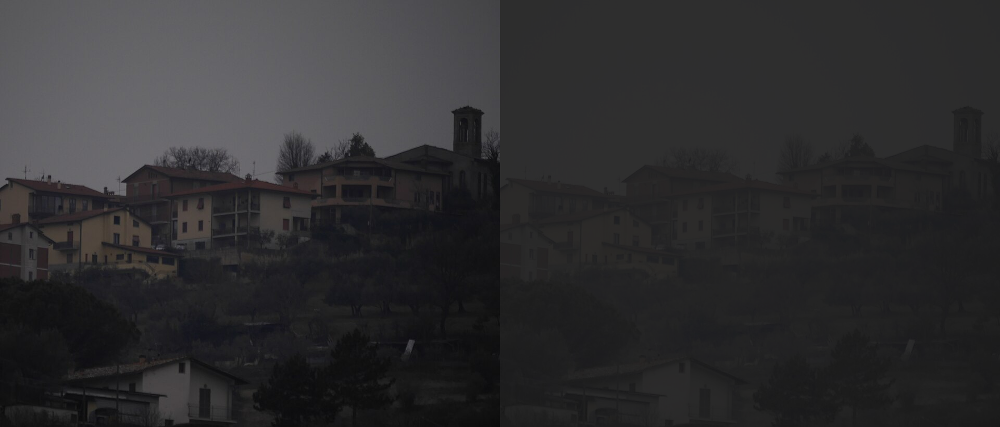

In [7]:
# transformasi logarithmic brightness
import numpy as np
import cv2 as cv
from google.colab.patches import cv2_imshow

print("mngubah tingkat kecerahan citra dgn transformasi log")
print("----------")
try:
  brightness = int(input("masukkan nilai kecerahan: "))
except ValueError:
  print("error , not a number")

# sesuaikan dgn file dan folder di drive
original = cv.imread("/content/drive/MyDrive/TI 3C RESOURCES /PCVK/Images/houses.jpg")
# s = c*log(1+r)
result = cv.convertScaleAbs(brightness*np.log1p(original))
final_frame = cv.hconcat((original, result))
cv2_imshow(final_frame)

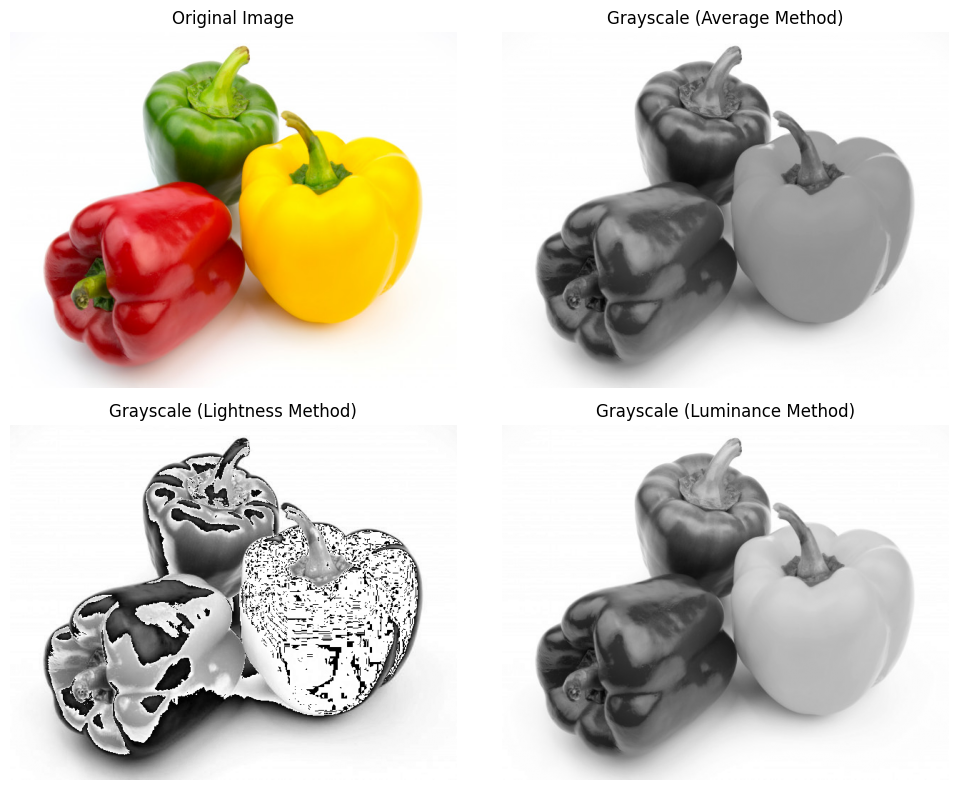

In [15]:
import matplotlib.pyplot as plt
import numpy as np
import cv2 as cv

original = cv.imread("/content/drive/MyDrive/TI 3C RESOURCES /PCVK/Images/peppers.jpg")

original_rgb = cv.cvtColor(original, cv.COLOR_BGR2RGB)

# 1. Average Method: (R + G + B) / 3
grayscale_image_avg = np.mean(original_rgb, axis=2).astype(np.uint8)

# 2. Lightness Method: (max(R, G, B) + min(R, G, B)) / 2
grayscale_image_lightness = ((np.max(original_rgb, axis=2) + np.min(original_rgb, axis=2)) / 2).astype(np.uint8)

# 3. Luminance Method: 0.299 * R + 0.587 * G + 0.114 * B
grayscale_image_luminance = (0.299 * original_rgb[:,:,0] + 0.587 * original_rgb[:,:,1] + 0.114 * original_rgb[:,:,2]).astype(np.uint8)

plt.figure(figsize=(10, 8))

plt.subplot(2, 2, 1)
plt.imshow(original_rgb)
plt.title("Original Image")
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(grayscale_image_avg, cmap='gray')
plt.title("Grayscale (Average Method)")
plt.axis('off')

plt.subplot(2, 2, 3)
plt.imshow(grayscale_image_lightness, cmap='gray')
plt.title("Grayscale (Lightness Method)")
plt.axis('off')

plt.subplot(2, 2, 4)
plt.imshow(grayscale_image_luminance, cmap='gray')
plt.title("Grayscale (Luminance Method)")
plt.axis('off')

plt.tight_layout()
plt.show()

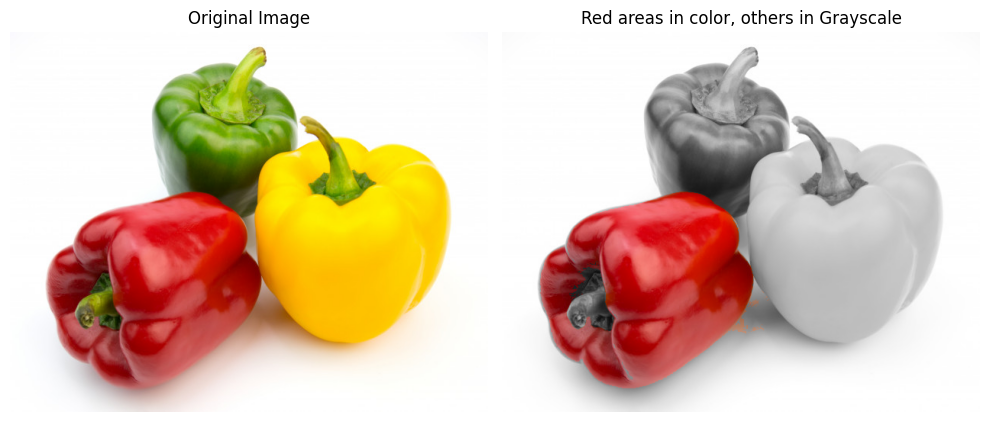

In [17]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt

# Load the image
original_bgr = cv.imread("/content/drive/MyDrive/TI 3C RESOURCES /PCVK/Images/peppers.jpg")
original_rgb = cv.cvtColor(original_bgr, cv.COLOR_BGR2RGB)

# Convert image to HSV color space
hsv_image = cv.cvtColor(original_bgr, cv.COLOR_BGR2HSV)

# Define the red color range in HSV
# Red color has two ranges in HSV (due to circular nature of Hue)
lower_red_1 = np.array([0, 100, 100])
upper_red_1 = np.array([10, 255, 255])
lower_red_2 = np.array([160, 100, 100])
upper_red_2 = np.array([179, 255, 255])

# Create masks for both red ranges
mask_red_1 = cv.inRange(hsv_image, lower_red_1, upper_red_1)
mask_red_2 = cv.inRange(hsv_image, lower_red_2, upper_red_2)

# Combine the masks to get the full red mask
full_red_mask = mask_red_1 + mask_red_2

# Create an inverted mask (non-red areas)
inverted_mask = cv.bitwise_not(full_red_mask)

# Convert the non-red areas to grayscale
grayscale_non_red = cv.cvtColor(original_bgr, cv.COLOR_BGR2GRAY)
grayscale_non_red_3_channel = cv.cvtColor(grayscale_non_red, cv.COLOR_GRAY2BGR)

# Combine the red parts with the grayscale non-red parts
# First, black out the non-red areas in the original image
red_only = cv.bitwise_and(original_bgr, original_bgr, mask=full_red_mask)

# Then, black out the red areas in the grayscale image
non_red_grayscale_only = cv.bitwise_and(grayscale_non_red_3_channel, grayscale_non_red_3_channel, mask=inverted_mask)

# Finally, combine the two parts
result_image = cv.add(red_only, non_red_grayscale_only)

# Convert result to RGB for matplotlib display
result_image_rgb = cv.cvtColor(result_image, cv.COLOR_BGR2RGB)

# Display the original and the processed image
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(original_rgb)
plt.title("Original Image")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(result_image_rgb)
plt.title("Red areas in color, others in Grayscale")
plt.axis('off')

plt.tight_layout()
plt.show()

gamma corection
----------
masukkan nilai gamma: 3


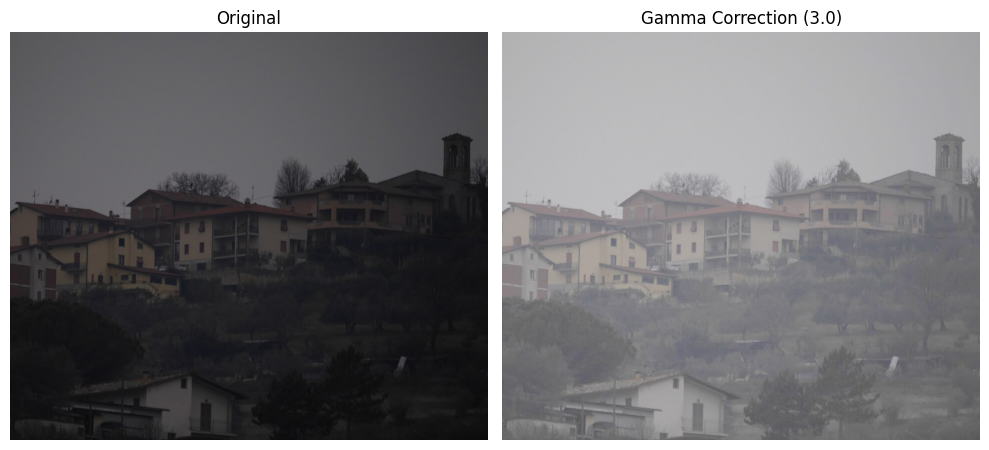

In [21]:
import numpy as np
import cv2 as cv
from google.colab.patches import cv2_imshow

print("gamma corection")
print("----------")
try:
  gamma = np.double(input("masukkan nilai gamma: "))
except ValueError:
  print("error , not a number")

# sesuaikan dgn file dan folder di drive
original = cv.imread("/content/drive/MyDrive/TI 3C RESOURCES /PCVK/Images/houses.jpg")
# Create an empty array for the gamma-corrected image
gamma_image = np.zeros(original.shape, original.dtype)

# Apply gamma correction pixel by pixel
for y in range(original.shape[0]):  # Loop over height
    for x in range(original.shape[1]):  # Loop over width
        for c in range(original.shape[2]):  # Loop over channels (R,G,B)
            # Normalize pixel to [0,1], apply gamma, scale back to [0,255]
            normalized_pixel = original[y, x, c] / 255.0
            gamma_corrected = np.power(normalized_pixel, 1.0 / gamma)
            gamma_image[y, x, c] = np.clip(255 * gamma_corrected, 0, 255)

# Convert original image from BGR to RGB for Matplotlib
original_rgb = cv.cvtColor(original, cv.COLOR_BGR2RGB)
gamma_image_rgb = cv.cvtColor(gamma_image, cv.COLOR_BGR2RGB)

# Create a figure with 2 subplots
plt.figure(figsize=(10, 5))

# Original image
plt.subplot(1, 2, 1)
plt.imshow(original_rgb)
plt.title('Original')
plt.axis('off')

# Gamma-corrected image
plt.subplot(1, 2, 2)
plt.imshow(gamma_image_rgb)
plt.title(f'Gamma Correction ({gamma})')
plt.axis('off')

# Adjust layout and display
plt.tight_layout()
plt.show()

bith dept
----------
Masukkan bit depth (1 sampai 8): 3


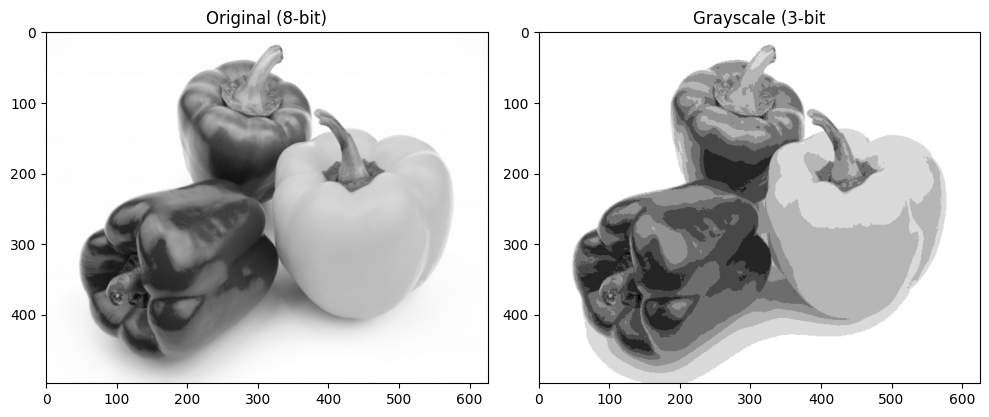

In [24]:
print("bith dept")
print("----------")
try:
  bit_depth = int(input('Masukkan bit depth (1 sampai 8): '))
  if not 1 <= bit_depth <= 8:
    print('Error: Bit depth harus antara 1 dan 8')
    exit()
except ValueError:
  print("error , not a number")

level = 255/ (pow(2,bit_depth)-1)
original = cv.imread("/content/drive/MyDrive/TI 3C RESOURCES /PCVK/Images/peppers.jpg", cv.IMREAD_GRAYSCALE)
depth_image = np.zeros(original.shape, original.dtype)

for y in range(original.shape[0]):  # Loop over height
    for x in range(original.shape[1]):  # Loop over width
        # Quantize: map pixel to nearest level using level = 255 / (2^bit_depth - 1)
        quantized_value = np.round(original[y, x] / level) * level
        depth_image[y, x] = np.clip(quantized_value, 0, 255)
# Create a figure with 2 subplots
plt.figure(figsize=(10, 5))

# Original image
plt.subplot(1, 2, 1)
plt.imshow(original, cmap='gray')
plt.title('Original (8-bit)')
plt.axis('on')

# Quantized image
plt.subplot(1, 2, 2)
plt.imshow(depth_image, cmap='gray')
plt.title(f'Grayscale ({bit_depth}-bit')
plt.axis('on')

# Adjust layout and display
plt.tight_layout()
plt.show()

Loaded 100 noisy images.


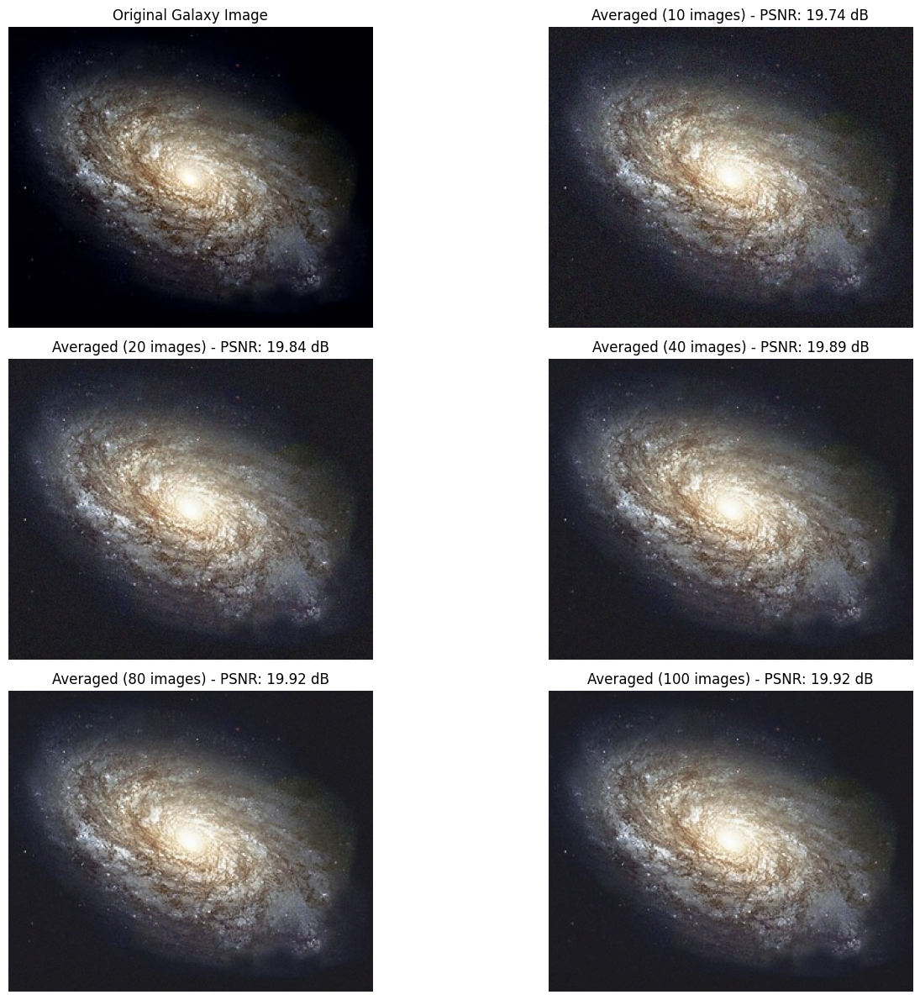


--- Average Denoising Results ---
No | Jumlah Citra di Average | Nilai PSNR (dB)
---|-------------------------|-----------------
1. | 10                      | 19.74
2. | 20                      | 19.84
3. | 40                      | 19.89
4. | 80                      | 19.92
5. | 100                     | 19.92

--- Kesimpulan ---
1. Apakah peningkatan jumlah citra selalu memberikan peningkatan PSNR yang signifikan?
   Berdasarkan hasil, peningkatan jumlah citra yang di-average cenderung meningkatkan nilai PSNR, yang menandakan pengurangan noise dan peningkatan kualitas citra. Namun, peningkatannya mungkin tidak selalu signifikan pada setiap tahap.
2. Pada jumlah citra berapa peningkatan mulai tidak terlalu signifikan?
   (Observasi dari tabel hasil di atas akan menunjukkan titik di mana peningkatan PSNR mulai melambat. Misalnya, setelah 40 atau 80 citra, peningkatan PSNR mungkin menjadi kurang drastis).
3. Apa Kesimpulan yang Anda peroleh dari percobaan ini?
   Average denoising ada

In [25]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt
import glob

# --- 1. Load Original Image ---
original_galaxy = cv.imread("/content/drive/MyDrive/TI 3C RESOURCES /PCVK/Images/galaxy.jpg")
if original_galaxy is None:
    print("Error: Original image 'galaxy.jpg' not found. Please check the path.")
    exit()

# Convert to RGB for consistent display with matplotlib
original_galaxy_rgb = cv.cvtColor(original_galaxy, cv.COLOR_BGR2RGB)

# --- 2. Load Noisy Images ---
noisy_images_paths = glob.glob('/content/drive/MyDrive/TI 3C RESOURCES /PCVK/Images/noises/*.jpg')
noisy_images_paths.sort() # Ensure consistent order

cv_img = []
for img_path in noisy_images_paths:
    n = cv.imread(img_path)
    if n is not None:
        cv_img.append(n)

if not cv_img:
    print("Error: No noisy images found. Please check the path to the 'noises' folder.")
    exit()

print(f"Loaded {len(cv_img)} noisy images.")

# --- 3. Define PSNR Calculation Function ---
def calculate_psnr(img1, img2):
    # Ensure images are of the same data type for comparison (e.g., float64 for MSE calculation)
    img1 = img1.astype(np.float64)
    img2 = img2.astype(np.float64)
    mse = np.mean((img1 - img2) ** 2)
    if mse == 0:
        return float('inf') # PSNR is infinite if images are identical
    max_pixel = 255.0
    psnr = 20 * np.log10(max_pixel / np.sqrt(mse))
    return psnr

# --- 4. Perform Average Denoising and Calculate PSNR ---
num_images_to_average = [10, 20, 40, 80, 100]
results = {}

plt.figure(figsize=(15, 12))

# Display Original Image
plt.subplot(3, 2, 1) # 3 rows, 2 columns, first plot
plt.imshow(original_galaxy_rgb)
plt.title('Original Galaxy Image')
plt.axis('off')


# Loop through different numbers of images for averaging
for i, num in enumerate(num_images_to_average):
    if num > len(cv_img):
        print(f"Warning: Not enough noisy images to average {num}. Skipping.")
        continue

    # Average denoising
    averaged_image = np.mean(cv_img[:num], axis=0).astype(np.uint8)

    # Convert to RGB for consistent display
    averaged_image_rgb = cv.cvtColor(averaged_image, cv.COLOR_BGR2RGB)

    # Calculate PSNR
    psnr_value = calculate_psnr(original_galaxy, averaged_image)
    results[num] = {'image': averaged_image_rgb, 'psnr': psnr_value}

    # Display result
    plt.subplot(3, 2, i + 2) # Start from second subplot position
    plt.imshow(averaged_image_rgb)
    plt.title(f'Averaged ({num} images) - PSNR: {psnr_value:.2f} dB')
    plt.axis('off')

plt.tight_layout()
plt.show()

# --- 5. Print Results Table and Conclusion ---
print("\n--- Average Denoising Results ---")
print("No | Jumlah Citra di Average | Nilai PSNR (dB)")
print("---|-------------------------|-----------------")
for i, num in enumerate(num_images_to_average):
    if num in results:
        print(f"{i+1}. | {num:<23} | {results[num]['psnr']:.2f}")

print("\n--- Kesimpulan ---")
print("1. Apakah peningkatan jumlah citra selalu memberikan peningkatan PSNR yang signifikan?")
print("   Berdasarkan hasil, peningkatan jumlah citra yang di-average cenderung meningkatkan nilai PSNR, yang menandakan pengurangan noise dan peningkatan kualitas citra. Namun, peningkatannya mungkin tidak selalu signifikan pada setiap tahap.")
print("2. Pada jumlah citra berapa peningkatan mulai tidak terlalu signifikan?")
print("   (Observasi dari tabel hasil di atas akan menunjukkan titik di mana peningkatan PSNR mulai melambat. Misalnya, setelah 40 atau 80 citra, peningkatan PSNR mungkin menjadi kurang drastis).")
print("3. Apa Kesimpulan yang Anda peroleh dari percobaan ini?")
print("   Average denoising adalah metode yang efektif untuk mengurangi Gaussian noise dengan menggabungkan beberapa citra yang bernoise dari scene yang sama. Semakin banyak citra yang digunakan, semakin baik pengurangan noisnya, yang tercermin dari nilai PSNR yang lebih tinggi. Namun, ada diminishing return; setelah jumlah citra tertentu, penambahan lebih banyak citra mungkin hanya memberikan sedikit peningkatan pada kualitas citra yang sudah baik. Ini menunjukkan adanya batas praktis untuk berapa banyak citra yang perlu di-average.")


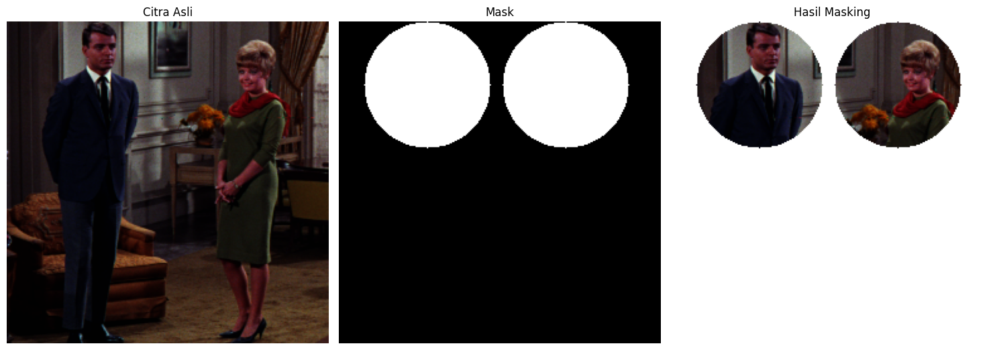

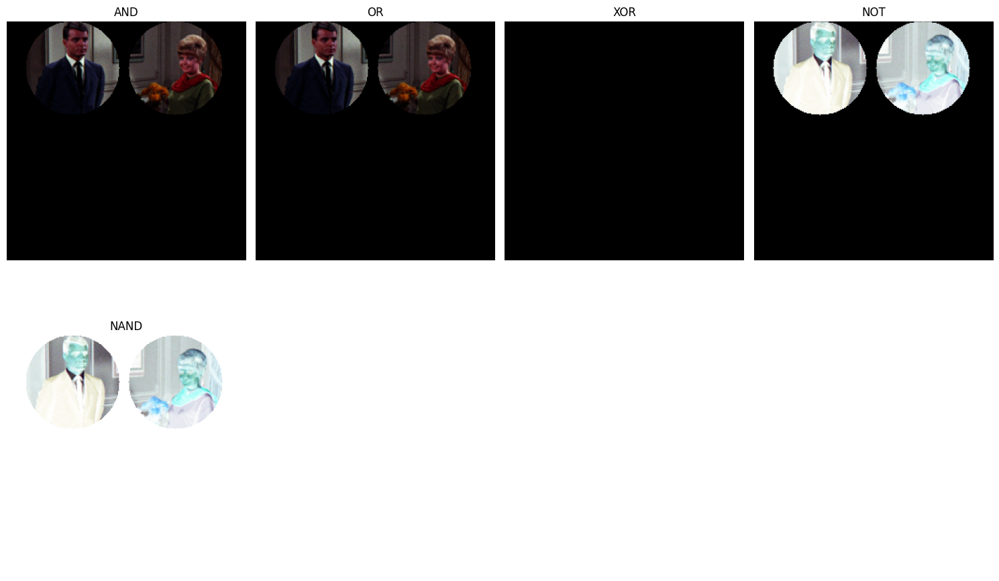

In [31]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Baca citra
img = cv.imread("/content/drive/MyDrive/TI 3C RESOURCES /PCVK/Images/couple.tiff")
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)

# Buat mask hitam dengan ukuran sama (hanya 1 channel)
mask = np.zeros(img.shape[:2], dtype="uint8")

# Tambahkan dua lingkaran pada mask
cv.circle(mask, (70, 50), 50, 255, -1)   # lingkaran kiri
cv.circle(mask, (180, 50), 50, 255, -1)   # lingkaran kanan

# Terapkan mask ke citra (bagian dalam lingkaran tetap berwarna)
masked = cv.bitwise_and(img, img, mask=mask)

# Buat background putih
background = np.ones_like(img, dtype="uint8") * 255
background[mask == 255] = masked[mask == 255]

# Gabungkan semua hasil agar layout sama persis
plt.figure(figsize=(15,6))

plt.subplot(1,3,1)
plt.imshow(img)
plt.title("Citra Asli")
plt.axis("off")

plt.subplot(1,3,2)
plt.imshow(mask, cmap="gray")
plt.title("Mask")
plt.axis("off")

plt.subplot(1,3,3)
plt.imshow(background)
plt.title("Hasil Masking")
plt.axis("off")

plt.tight_layout()
plt.show()


# Hasil bitwise
and_result  = cv.bitwise_and(img, img, mask=mask)
or_result   = cv.bitwise_or(img, img, mask=mask)     # praktis sama dengan AND (area putih muncul)
xor_result  = cv.bitwise_xor(img, img, mask=mask)    # area putih jadi hitam
not_result  = cv.bitwise_not(img, mask=mask)         # komplemen di area mask
nand_result = cv.bitwise_not(and_result)             # NOT dari hasil AND

# Tampilkan semua
titles = [ "AND", "OR", "XOR", "NOT", "NAND"]
images = [and_result, or_result, xor_result, not_result, nand_result]

plt.figure(figsize=(15,10))
for i in range(len(images)):
    plt.subplot(2,4,i+1)
    if titles[i] == "Mask":
        plt.imshow(images[i], cmap="gray")
    else:
        plt.imshow(images[i])
    plt.title(titles[i])
    plt.axis("off")
plt.tight_layout()
plt.show()

Hasil Analisis

- Not
Operator NOT membalikkan nilai piksel (0 → 255, 255 → 0)
Hasil: area yang ditutupi mask berubah jadi warna kebalikan citra asli.
Makanya wajah dalam lingkaran terlihat seperti negatif film.
- OR
Dalam citra + mask, OR membuat area mask memunculkan citra asli.
Hasilnya mirip dengan AND karena citra sama-sama diambil dari area putih mask.
Bedanya: kalau dibandingkan dua citra berbeda, OR akan menggabungkan bagian yang aktif di salah satunya.
- AND
hanya mempertahankan piksel di area mask putih.
Hasil: wajah dalam lingkaran tetap warna asli, luar lingkaran hitam.Ini operator yang sering dipakai untuk masking.
- NAND
Hasil = kebalikan dari AND.
Artinya area lingkaran justru dibalik warnanya, sedangkan luar lingkaran jadi putih. Terlihat seperti masking invers.
- XOR
akan menghasilkan hitam bila input sama, putih bila beda.
Karena kita pakai citra yang sama dengan dirinya, di area mask hasilnya hitam (karena piksel sama).
Jadi wajah dalam lingkaran jadi hilang (hitam), luar lingkaran tetap putih/gelap.

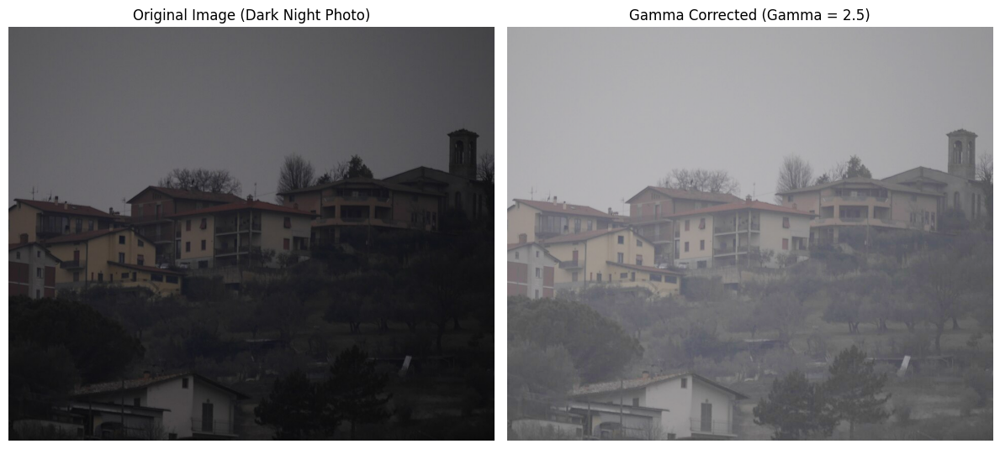


--- Analisis Metode Gamma Correction ---
Metode yang digunakan: Gamma Correction
Nilai Gamma: 2.5

Alasan Penggunaan:
  Gamma Correction dipilih karena efektif untuk meningkatkan kecerahan di area gelap pada citra tanpa membuat area yang sudah terang menjadi terlalu 'blown out' (hilang detail karena terlalu putih). Hal ini sangat cocok untuk foto malam hari yang seringkali memiliki kontras rendah di area gelap namun masih menyimpan detail yang ingin ditampilkan. Dengan gamma > 1 (seperti 2.5), nilai-nilai piksel yang lebih rendah (area gelap) akan dinaikkan lebih signifikan dibandingkan nilai-nilai piksel yang lebih tinggi (area terang), sehingga detail di bayangan menjadi lebih terlihat.

Risiko Metode:
  1. Perubahan Warna: Gamma correction dapat mengubah persepsi warna pada citra, terutama jika diterapkan secara berlebihan atau tidak seragam di seluruh kanal warna.
  2. Peningkatan Noise: Dengan mencerahkan area gelap, noise yang mungkin tidak terlihat sebelumnya di area tersebut d

In [33]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt

# --- 1. Load Image ---
image_path = "/content/drive/MyDrive/TI 3C RESOURCES /PCVK/Images/houses.jpg" # Ganti dengan foto malam hari yang gelap jika ada
original_bgr = cv.imread(image_path)

if original_bgr is None:
    print(f"Error: Image not found at {image_path}. Please ensure the path is correct.")
else:
    original_rgb = cv.cvtColor(original_bgr, cv.COLOR_BGR2RGB)

    # --- 2. Implement Gamma Correction ---
    gamma = 2.5 # Nilai gamma > 1 akan mencerahkan area gelap

    # Create a lookup table (LUT) for gamma correction
    # s = L * (r/L)^gamma, where L=255 for 8-bit images
    table = np.array([((i / 255.0) ** (1.0 / gamma)) * 255 for i in np.arange(0, 256)]).astype("uint8")

    # Apply gamma correction using the lookup table
    gamma_corrected_bgr = cv.LUT(original_bgr, table)
    gamma_corrected_rgb = cv.cvtColor(gamma_corrected_bgr, cv.COLOR_BGR2RGB)

    # --- 3. Display Results ---
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.imshow(original_rgb)
    plt.title('Original Image (Dark Night Photo)')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(gamma_corrected_rgb)
    plt.title(f'Gamma Corrected (Gamma = {gamma})')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

    # --- 4. Analysis ---
    print("\n--- Analisis Metode Gamma Correction ---")
    print("Metode yang digunakan: Gamma Correction")
    print(f"Nilai Gamma: {gamma}")
    print("\nAlasan Penggunaan:")
    print("  Gamma Correction dipilih karena efektif untuk meningkatkan kecerahan di area gelap pada citra tanpa membuat area yang sudah terang menjadi terlalu 'blown out' (hilang detail karena terlalu putih). Hal ini sangat cocok untuk foto malam hari yang seringkali memiliki kontras rendah di area gelap namun masih menyimpan detail yang ingin ditampilkan. Dengan gamma > 1 (seperti 2.5), nilai-nilai piksel yang lebih rendah (area gelap) akan dinaikkan lebih signifikan dibandingkan nilai-nilai piksel yang lebih tinggi (area terang), sehingga detail di bayangan menjadi lebih terlihat.")
    print("\nRisiko Metode:")
    print("  1. Perubahan Warna: Gamma correction dapat mengubah persepsi warna pada citra, terutama jika diterapkan secara berlebihan atau tidak seragam di seluruh kanal warna.")
    print("  2. Peningkatan Noise: Dengan mencerahkan area gelap, noise yang mungkin tidak terlihat sebelumnya di area tersebut dapat menjadi lebih menonjol dan mengganggu. Ini bisa membuat citra terlihat 'grainy'.")
    print("  3. Kehilangan Kontras: Jika nilai gamma terlalu tinggi, citra mungkin kehilangan kontras secara keseluruhan, tampak 'flat' atau pudar, karena perbedaan antara area terang dan gelap menjadi berkurang.")
    print("  4. Kurva Non-linear: Meskipun gamma correction bekerja dengan baik untuk mata manusia, sifat non-linearnya berarti tidak selalu 'benar secara ilmiah' dalam merepresentasikan intensitas cahaya asli, yang mungkin menjadi isu dalam aplikasi ilmiah atau medis.")

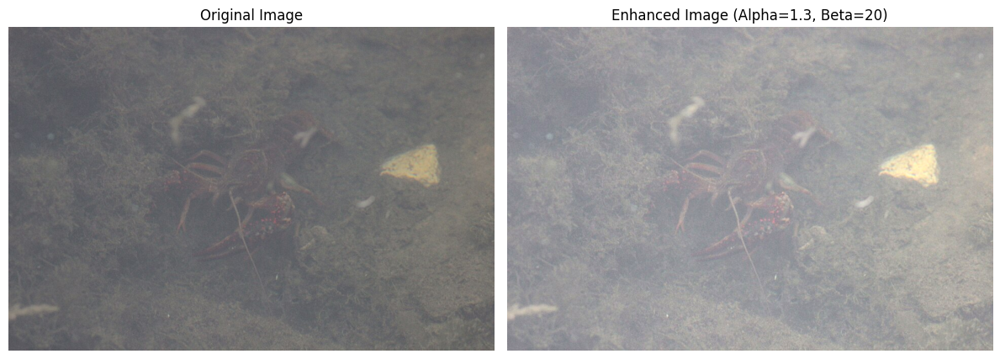


--- Analisis Peningkatan Kualitas Citra --- 

Metode yang Dipilih:
  Transformasi Linier (Penyesuaian Kontras dan Kecerahan) menggunakan `cv2.convertScaleAbs`.

Alasan Pemilihan:
  Metode ini adalah operasi dasar yang sangat umum dan efektif untuk 'memperbaiki' citra yang mungkin terlihat agak datar atau gelap. Ini memungkinkan penyesuaian kontras dan kecerahan secara simultan, yang seringkali diperlukan untuk menonjolkan detail dan membuat gambar lebih hidup. Untuk citra seperti `crayfish.jpg`, yang mungkin memiliki detail tersembunyi di area yang sedikit gelap, peningkatan kontras dan kecerahan dapat membuat tekstur dan warna menjadi lebih jelas.

Menentukan Parameter Terbaik:
  Parameter yang digunakan adalah Alpha (kontras) = 1.3 dan Beta (kecerahan) = 20.
  Penentuan parameter terbaik biasanya melibatkan beberapa percobaan iteratif sambil mengamati hasilnya secara visual. Tujuan utamanya adalah untuk: 
  - Meningkatkan kontras tanpa menyebabkan highlight menjadi 'blown out' (terl

In [34]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt

# --- 1. Load Image ---
image_path = "/content/drive/MyDrive/TI 3C RESOURCES /PCVK/Images/crayfish.jpg"
original_bgr = cv.imread(image_path)

if original_bgr is None:
    print(f"Error: Image not found at {image_path}. Please ensure the path is correct.")
else:
    original_rgb = cv.cvtColor(original_bgr, cv.COLOR_BGR2RGB)

    # --- 2. Metode yang Dipilih: Transformasi Linier (Kontras dan Kecerahan) ---
    # Menggunakan cv2.convertScaleAbs(src, alpha, beta)
    # g(x,y) = alpha * f(x,y) + beta
    # alpha adalah faktor kontras (alpha > 1 meningkatkan kontras, alpha < 1 mengurangi)
    # beta adalah faktor kecerahan (beta > 0 mencerahkan, beta < 0 menggelapkan)

    # --- 3. Menentukan Parameter Terbaik ---
    # Parameter ini ditentukan secara eksperimental untuk mencapai keseimbangan visual yang diinginkan.
    # Untuk citra 'crayfish.jpg', seringkali diperlukan sedikit peningkatan kontras dan kecerahan.
    alpha_val = 1.3  # Meningkatkan kontras sedikit
    beta_val = 20   # Mencerahkan gambar sedikit

    # --- 4. Terapkan Metode ---
    enhanced_bgr = cv.convertScaleAbs(original_bgr, alpha=alpha_val, beta=beta_val)
    enhanced_rgb = cv.cvtColor(enhanced_bgr, cv.COLOR_BGR2RGB)

    # --- 5. Menghasilkan Citra dengan Before-After ---
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.imshow(original_rgb)
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(enhanced_rgb)
    plt.title(f'Enhanced Image (Alpha={alpha_val}, Beta={beta_val})')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

    # --- 6. Penjelasan/Analisis ---
    print("\n--- Analisis Peningkatan Kualitas Citra --- ")
    print("\nMetode yang Dipilih:")
    print("  Transformasi Linier (Penyesuaian Kontras dan Kecerahan) menggunakan `cv2.convertScaleAbs`.")

    print("\nAlasan Pemilihan:")
    print("  Metode ini adalah operasi dasar yang sangat umum dan efektif untuk 'memperbaiki' citra yang mungkin terlihat agak datar atau gelap. Ini memungkinkan penyesuaian kontras dan kecerahan secara simultan, yang seringkali diperlukan untuk menonjolkan detail dan membuat gambar lebih hidup. Untuk citra seperti `crayfish.jpg`, yang mungkin memiliki detail tersembunyi di area yang sedikit gelap, peningkatan kontras dan kecerahan dapat membuat tekstur dan warna menjadi lebih jelas.")

    print("\nMenentukan Parameter Terbaik:")
    print(f"  Parameter yang digunakan adalah Alpha (kontras) = {alpha_val} dan Beta (kecerahan) = {beta_val}.")
    print("  Penentuan parameter terbaik biasanya melibatkan beberapa percobaan iteratif sambil mengamati hasilnya secara visual. Tujuan utamanya adalah untuk: ")
    print("  - Meningkatkan kontras tanpa menyebabkan highlight menjadi 'blown out' (terlalu putih tanpa detail) atau shadow menjadi 'crushed' (terlalu hitam tanpa detail).")
    print("  - Menyesuaikan kecerahan agar citra tidak terlalu gelap maupun terlalu terang secara keseluruhan.")
    print("  Nilai `alpha = 1.3` dipilih untuk sedikit memperkuat perbedaan antara area terang dan gelap, membuat detail sirip dan tubuh crayfish lebih menonjol. Nilai `beta = 20` ditambahkan untuk memberikan sedikit pencerahan secara keseluruhan, memastikan area yang sebelumnya gelap memiliki visibilitas yang lebih baik.")

    print("\nMenghasilkan Citra dengan Before-After:")
    print("  Gambar di atas menunjukkan perbandingan citra asli dan citra yang telah ditingkatkan kualitasnya, dengan peningkatan kontras dan kecerahan yang terlihat jelas, menonjolkan detail crayfish.")